In [1]:
#!/usr/bin/env python
'''Project: Towards the development of a simple fingerprint representation for
the efficient comparison and clustering of large datasets of RNA sequences
By: Abdulvahab Kharadi
First supervisor Name: Irilenia Nobeli
Date: 01/06/20
version: v2.0.0'''

# importing required module
from sys import argv
# import cgi
#import cgitb
import hashlib
import re
import os
#cgitb.enable()

def get_data(hairpins_file, max_energy):

    ## empty list
    refine_data = []

    ## opening hairpins.out file obtained
    ## from 2ndscore
    with open (hairpins_file, 'r') as f:

        # splitting the file by sequence identifiers to separate multi-sequence
        # into multiple lists
        data_extractor = f.read().split(">")
        data_extractor.pop(0)
        obj = {}
        for i in data_extractor:
            lines = i.splitlines()
            
            seq_name = lines.pop(0)
            refine_data.append(seq_name)
            data = [line.split() for line in lines]
            obj[str(refine_data[data_extractor.index(i)])] = [d for d in data if d[0] != "None" and float(d[0]) <= max_energy]
            
            continue
        return [refine_data, obj]
#refined_data = get_data('../Dataset/hairpins/sequence_1.fasta.out')
#refined_data_multi = get_data('../Dataset/hairpins/sequence_multi.fasta.out')
#empty_file = get_data('../test_data_compempty.out')
#print(refined_data)
#print(empty_file)
#print(refined_data_multi)

#Better way to call is to separate the two objects returned (i.e. the list of names from the dictionary of hairpins)
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
print("Sequence names:\n", seq_names)
print("Refined data:", refined_data_multi)
print("Length of refined data:", len(refined_data_multi))

Sequence names:
 ['CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD', 'AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD', 'CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD']
Refined data: {'CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD': [['-1', '33', '..', '43', 'TTAATCCGACTTTGA', 'CAAC', 'CGG', 'GATG', 'GACCTCTTACAGGTG'], ['-0.3', '38', '..', '48', 'CCGACTTTGACAACC', 'GGG', 'ATGGA', 'CCT', 'CTTACAGGTGGGAGA'], ['-2.5', '46', '..', '56', 'GACAACCGGGATGGA', 'CCT', 'CTTAC', 'AGG', 'TGGGAGAGACGGAAG'], ['-3.4', '45', '..', '57', 'TGACAACCGGGATGG', 'ACCT', 'CTTAC', 'AGGT', 'GGGAGAGACGGAAGT']], 'AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD': [['-0.1', '12', '..', '23', 'xxxxTTACGTTCATC', 'TAC', 'TTAATC', 'GTA', 'GACGCATCAATACAT'], ['-2.4', '11', '..', '24', 'xxxxxTTACGTTCAT', 'CTAC', 'TTAATC', 'GTAG'

In [2]:
def palindromes(data):
    '''This function (called new_palindromes in Roberto's notebook) takes the refined data 
    from a get_data and returns a dictionary with sequences as keys 
    and a list of palindromes as the value for each key.
    Each palindrome represented by a four cordinate, two for left steam and two for right steam'''
    ## creates empty dictionary   
    palindrome= {}
    ## itirates through the refined data
    for seqname in data: # each seqname is a sequence header (the key in the dictionary)
        # create empty list that will contain the palindromes
        pal_list = []
        ## word divides each line in a list
        for j in data[seqname]:
            word = j

            energy = float(word[0])

            ## start is the base where hairpin starts
            start = int(word[1])

            ## positions 5 and 7 tend to have - character
            ## here we remove them left being 5, and right 7
            lsteam = re.sub('-','',word[5])           #Left steam of a pallindrome,cleaning data
            rsteam = re.sub('-','',word[7])           #Right steam of a pallindrome,cleaning data

            loop = word[6]

            ## index 3 represents the lenght of the hairpin
            length = int(word[3])

            p = [start,start+len(lsteam)-1,length-len(rsteam)+1,length]
            pal_list.append(p)        
        palindrome[seqname]=sorted(pal_list)
    return palindrome                 # sorting list accrding to start position

(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2)
pals = palindromes(refined_data_multi)
for seqname in pals:
    print("Sequence=", seqname, " palindromes:", pals[seqname])


Sequence= CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  palindromes: [[33, 36, 40, 43], [38, 40, 46, 48], [45, 48, 54, 57], [46, 48, 54, 56]]
Sequence= AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  palindromes: [[8, 14, 21, 27], [10, 14, 21, 25], [11, 14, 21, 24], [12, 14, 21, 23]]
Sequence= CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  palindromes: [[8, 13, 18, 23], [9, 13, 18, 22], [10, 13, 17, 20], [10, 13, 18, 21]]


In [3]:
def relation(p1,p2):
    '''This function take list of palindromes and return relationship between two palindromes in form of a Letter.
    Where O=overlapping,S=serial,X=exclusive,I=Included'''
    if p1[3] < p2[0]:
        return 'S'
    elif p1[1] < p2[0] and p1[2] > p2[1] and p1[3] < p2[2]:
        return 'O'
    elif p1[1]<p2[0] and p1[2] > p2[3] :
        return 'I'
    else:
        return 'X'

In [4]:
def pgraph(palindrome):
    '''This function give graph from each pallindrome (consider as Node) to another pallindrome.
    There is no path between pallindrome having Exclusive(X) relation.
    Rerurns dictionary which has Node as key and list of paths from that node as list'''
    #palindrome = palindromes()
    #print(len(palindrome))
    graph = {}
    for i in range(len(palindrome)):
        path = []
        for j in range(i+1,len(palindrome)):
            r = relation(palindrome[i],palindrome[j])
            if r != 'X':
                path.append(j)
        graph[i] = path #moving this here ensures the last i will also have an empty path added
    return graph


(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2)
pals = palindromes(refined_data_multi)
for seqname in pals:
    print("Sequence=", seqname, " palindromes:", pals[seqname])
    print(pgraph(pals[seqname]))


Sequence= CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  palindromes: [[33, 36, 40, 43], [38, 40, 46, 48], [45, 48, 54, 57], [46, 48, 54, 56]]
{0: [2, 3], 1: [], 2: [], 3: []}
Sequence= AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  palindromes: [[8, 14, 21, 27], [10, 14, 21, 25], [11, 14, 21, 24], [12, 14, 21, 23]]
{0: [], 1: [], 2: [], 3: []}
Sequence= CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  palindromes: [[8, 13, 18, 23], [9, 13, 18, 22], [10, 13, 17, 20], [10, 13, 18, 21]]
{0: [], 1: [], 2: [], 3: []}


Graph for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  :

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]


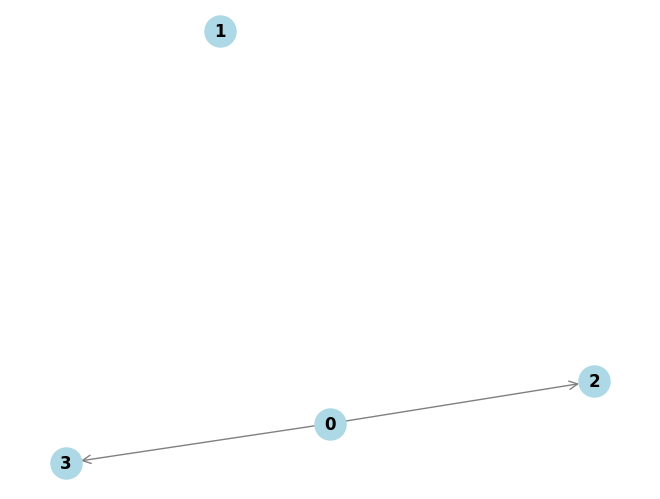

Graph for sequence  AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []


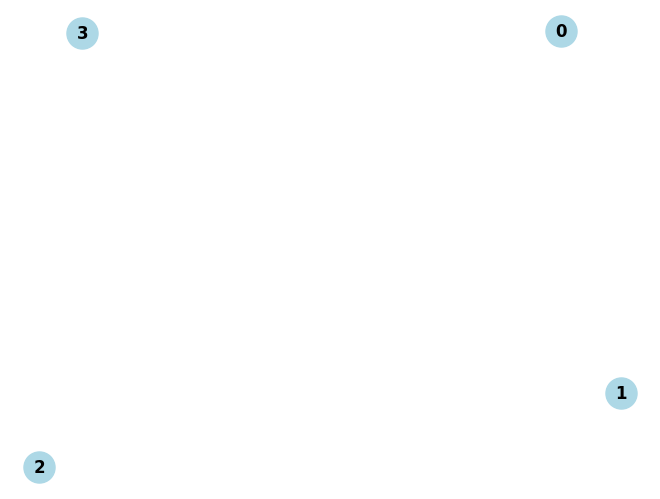

Graph for sequence  CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []


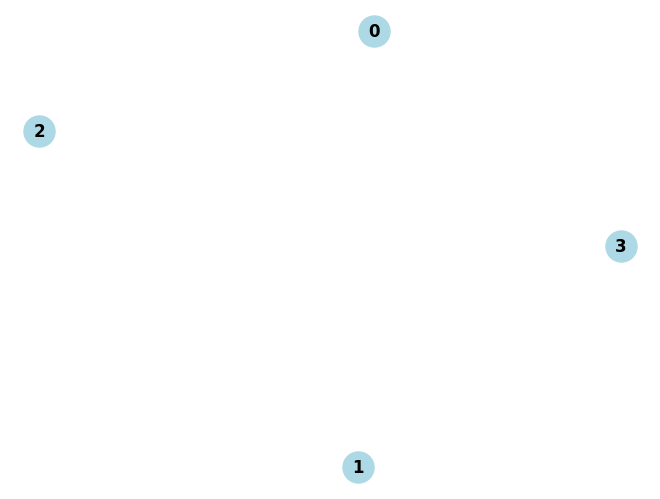

In [5]:
import networkx as nx
import matplotlib.pyplot as plt
#code from DeepSeek

def build_directed_graph_from_dict(graph_dict):
    """
    Builds a directed NetworkX graph from a dictionary where keys are vertex names
    and values are lists of connected vertices. The direction of edges is determined
    by alphanumeric comparison of the vertex names (smaller -> larger).

    Parameters:
    graph_dict (dict): A dictionary representing the graph adjacency list.

    Returns:
    networkx.DiGraph: The constructed directed graph.
    """
    G = nx.DiGraph()

    for node, neighbors in graph_dict.items():
        G.add_node(node)
        for neighbor in neighbors:
            # Determine direction based on alphanumeric order
            if node < neighbor:
                G.add_edge(node, neighbor)
            else:
                G.add_edge(neighbor, node)

    return G

def draw_directed_graph(G):
    """
    Draws the directed graph using matplotlib.

    Parameters:
    G (networkx.DiGraph): The directed graph to draw.
    """
    pos = nx.spring_layout(G)  # Positions nodes using a force-directed layout
    nx.draw(
        G,
        pos,
        with_labels=True,
        node_color='lightblue',
        edge_color='gray',
        node_size=500,
        font_weight='bold',
        arrows=True,
        arrowstyle='->',
        arrowsize=15,
    )
    plt.show()

#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("Graph for sequence ", seqname, " :\n")
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())

    # Draw the graph
    draw_directed_graph(G)


In [6]:
#NOT USED
from copy import deepcopy
def find_all_dags(G):
    """Finds all possible DAGs (subgraphs) of the given directed graph."""
    edges = list(G.edges())
    all_dags = []
    
    def backtrack(current_edges, start_idx, current_graph):
        """Recursively builds DAGs by adding edges without cycles."""
        if nx.is_directed_acyclic_graph(current_graph):
            all_dags.append(deepcopy(current_graph))
        for i in range(start_idx, len(edges)):
            u, v = edges[i]
            current_graph.add_edge(u, v)
            if nx.is_directed_acyclic_graph(current_graph):
                backtrack(current_edges + [(u, v)], i + 1, current_graph)
            current_graph.remove_edge(u, v)
    
    backtrack([], 0, nx.DiGraph())
    return all_dags


#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("Graph for sequence ", seqname, " :\n")
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    all_dags = find_all_dags(G)
    print(f"Total DAGs found: {len(all_dags)}")
    for i in range(len(all_dags)):
        print("Nodes for DAG ", i, ": ", all_dags[i].nodes())
        print("Edges for DAG ", i, ": ", all_dags[i].edges())

Graph for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  :

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]
Total DAGs found: 4
Nodes for DAG  0 :  []
Edges for DAG  0 :  []
Nodes for DAG  1 :  [0, 2]
Edges for DAG  1 :  [(0, 2)]
Nodes for DAG  2 :  [0, 2, 3]
Edges for DAG  2 :  [(0, 2), (0, 3)]
Nodes for DAG  3 :  [0, 2, 3]
Edges for DAG  3 :  [(0, 3)]
Graph for sequence  AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Total DAGs found: 1
Nodes for DAG  0 :  []
Edges for DAG  0 :  []
Graph for sequence  CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Total DAGs found: 1
Nodes for DAG  0 :  []
Edges for DAG  0 :  []


In [7]:
#NOT USED
def maximal_dag(G):
    """
    Returns a maximal DAG subgraph of G by removing a minimal feedback arc set (FAS).
    Uses a greedy heuristic to approximate the minimal FAS.

    Steps: 
     --Checks if the graph is already a DAG.
     --If not, it iteratively removes edges that participate in cycles (FAS) until the graph becomes a DAG.
     --Uses nx.topological_sort to check for cycles and nx.find_cycle to identify edges to remove.
     Key points:
     --Maximal DAG: Retains as many edges as possible while being acyclic.
     --Heuristic-Based: The solution uses a greedy approach to approximate the minimal FAS, which works well in practice for many cases.
     --Efficiency: This method is efficient for moderate-sized graphs but may not always find the absolute maximal DAG (due to NP-hardness of the problem).
    """
    if nx.is_directed_acyclic_graph(G):
        return G.copy()

    # Compute a minimal feedback arc set (FAS) using a greedy heuristic
    fas = set()
    H = G.copy()

    while True:
        try:
            # Try to find a topological order
            order = list(nx.topological_sort(H))
            break
        except nx.NetworkXUnfeasible:
            # If not a DAG, find and remove a cycle edge
            cycle = nx.find_cycle(H)
            edge_to_remove = cycle[0]  # Remove the first edge of the found cycle
            fas.add(edge_to_remove)
            H.remove_edge(*edge_to_remove)

    # The maximal DAG is the original graph minus the FAS
    maximal_dag_graph = G.copy()
    maximal_dag_graph.remove_edges_from(fas)
    return maximal_dag_graph


#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("Graph for sequence ", seqname, " :\n")
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    max_dag = maximal_dag(G)
    print("Nodes for max DAG : ", max_dag.nodes())
    print("Edges for max DAG : ", max_dag.edges())

Graph for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  :

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]
Nodes for max DAG :  [0, 2, 3, 1]
Edges for max DAG :  [(0, 2), (0, 3)]
Graph for sequence  AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Nodes for max DAG :  [0, 1, 2, 3]
Edges for max DAG :  []
Graph for sequence  CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Nodes for max DAG :  [0, 1, 2, 3]
Edges for max DAG :  []


In [8]:
#NOT USED
def find_all_max_paths_from_each_node(G):
    """Finds all maximal directed paths starting from each node in the graph."""
    all_max_paths = {}
    for node in G.nodes():
        stack = [(node, [node])]  # (current_node, current_path)
        max_paths = []
        max_length = 0
        while stack:
            current_node, current_path = stack.pop()
            # Update max_length and max_paths
            if len(current_path) > max_length:
                max_length = len(current_path)
                max_paths = [current_path.copy()]
            elif len(current_path) == max_length:
                max_paths.append(current_path.copy())
            # Explore neighbors
            for neighbor in G.successors(current_node):
                if neighbor not in current_path:  # Avoid cycles
                    stack.append((neighbor, current_path + [neighbor]))
        all_max_paths[node] = max_paths
    return all_max_paths


#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("Graph for sequence ", seqname, " :\n")
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    max_paths = find_all_max_paths_from_each_node(G)
    for node, paths in max_paths.items():
        print(f"Max path from {node}:")
        for path in paths:
            print(path)

Graph for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  :

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]
Max path from 0:
[0, 3]
[0, 2]
Max path from 2:
[2]
Max path from 3:
[3]
Max path from 1:
[1]
Graph for sequence  AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Max path from 0:
[0]
Max path from 1:
[1]
Max path from 2:
[2]
Max path from 3:
[3]
Graph for sequence  CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Max path from 0:
[0]
Max path from 1:
[1]
Max path from 2:
[2]
Max path from 3:
[3]


In [9]:
def find_paths_up_to_length(G, l):
    """Finds all paths from each node up to length l, sorted by path length."""
    all_paths = {}
    for node in G.nodes():
        stack = [(node, [node])]  # (current_node, current_path)
        node_paths = []
        while stack:
            current_node, current_path = stack.pop()
            # Add path if it's within the length limit
            if len(current_path) <= l:
                node_paths.append(current_path.copy())
                # Explore neighbors if we haven't reached length limit
                if len(current_path) < l:
                    for neighbor in G.successors(current_node):
                        if neighbor not in current_path:  # Avoid cycles
                            stack.append((neighbor, current_path + [neighbor]))
        # Sort paths first by length, then lexicographically
        node_paths.sort(key=lambda x: (len(x), x))
        all_paths[node] = node_paths
    return all_paths

#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("Graph for sequence ", seqname, " :\n")
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    all_paths = find_paths_up_to_length(G, 5)
    for node, paths in all_paths.items():
        print(f"Paths from {node}:")
        for path in paths:
            print(path)

Graph for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  :

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]
Paths from 0:
[0]
[0, 2]
[0, 3]
Paths from 2:
[2]
Paths from 3:
[3]
Paths from 1:
[1]
Graph for sequence  AACY023852401.1:c427-367 Marine metagenome ctg_1101668659752, whole genome shotgun sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Paths from 0:
[0]
Paths from 1:
[1]
Paths from 2:
[2]
Paths from 3:
[3]
Graph for sequence  CT978603.1:1340859-1340915 Synechococcus sp. RCC307 genomic DNA sequence FORWARD  :

Nodes of the graph: [0, 1, 2, 3]
Edges of the graph: []
Paths from 0:
[0]
Paths from 1:
[1]
Paths from 2:
[2]
Paths from 3:
[3]


In [10]:
def fingerprint(graph, palindromes, max_path_length):
    '''This function creates a fingerprint by concatenating the relationships between palindromes along a path in a directed graph'''
    uniq_rel = []
    rel_list=[]
    fp = ''
    
    #find all the paths up to a certain length starting from each node in the graph
    all_paths = find_paths_up_to_length(G, 5)
    
    #TEST PRINT
    print("Palindromes=", palindromes)
    #for node, paths in all_paths.items():
    #   print(f"Paths from {node}:")
    #  for path in paths:
    #     print(path)

    #go through every node and path and create a set of unique character strings describing 
    #the relationships between all nodes (palindromes)
    for node, paths in all_paths.items():
        #print("node is now: ", node)
        rel=''  #every node has a string built from all the relationships encountered in the paths
        for path in paths:
            if (len(path)>1):
                #print("path is now:", path)
                for i in range(len(path)-1):
                    #TEST PRINT
                    #print("i=", i)
                    #print("palindrome 1=", palindromes[path[i]], "palindrome 2=", palindromes[path[i+1]])
                    rel += relation(palindromes[path[i]], palindromes[path[i+1]])
                #add a ";" to separate the paths   
                rel += ';' #separate paths
                #print("finished path; rel is now=", rel)
        if (rel == ''): #nothing has been added
            rel = '-' #to indicate that this node is on its own and has no paths to others
        rel_list.append(rel)
        #print("just appended relation: ", rel)

    #keep unique relationships only
    #uniq_rel = set(rel_list)

    return(rel_list)


def fing_binary(features, size=1024):
    bit_vector = [0] * size

    for feature in features:
        # Hash the feature string
        b = feature.encode('utf-8')
        h = hashlib.sha256(b).hexdigest()
        index = int(h, 16) % size  # map to a position in the bit vector
        bit_vector[index] = 1

    return bit_vector

#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    fp = fingerprint(G, pals[seqname], 5) #max_path_length=5
    print("Fingerprint for sequence ", seqname, " :", fp)
    bin_fp = fing_binary(fp)
    print("Binary fingerprint for sequence ", seqname, " :", bin_fp)

Nodes of the graph: [0, 2, 3, 1]
Edges of the graph: [(0, 2), (0, 3)]
Palindromes= [[33, 36, 40, 43], [38, 40, 46, 48], [45, 48, 54, 57], [46, 48, 54, 56]]
Fingerprint for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  : ['S;S;', '-', '-', '-']
Binary fingerprint for sequence  CP001344.1:2330090-2330186 Cyanothece sp. PCC 7425, complete genome FORWARD  : [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,

Functions below are not used.

In [ ]:
def string_fingerprint_with_positions(features, size=1024):
    # create list of 1024 0's
    bit_vector = [0] * size
    # loop over index(i) and feature e.g.'S;S'
    for i, feature in enumerate(features):
        # index:feature
        tag = f"{i}:{feature}"  # combine position + value
        # encode tag to utf-8, then to 32-byte and then to hexadecimal charactesr string
        h = hashlib.sha256(tag.encode()).hexdigest()
        # transform hexadecimal string to base-10 integer and then 
        # get modulus to integrate on binned fingerprint
        # fits into range of 0-1023
        # RAGATH-10 RAGATH-11
        index = int(h, 16) % size
        # result becomes a 1 on the fingerprint
        bit_vector[index] = 1
    return bit_vector


seq1 = ['S;S;', '-', '-', '-']
seq2 = ['-', '-', '-', '-']

fp3 = string_fingerprint_with_positions(seq1)
fp4 = string_fingerprint_with_positions(seq2)

print("Non-zero indices for fp3:", [i for i, b in enumerate(fp3) if b == 1])
print("Non-zero indices for fp4:", [i for i, b in enumerate(fp4) if b == 1])
print("Total bits set in fp3:", sum(fp3))
print("Total bits set in fp4:", sum(fp4))

Non-zero indices for fp3: [70, 226, 366, 683]
Non-zero indices for fp4: [226, 366, 683, 941]
Total bits set in fp3: 4
Total bits set in fp4: 4


In [12]:
# testing fingerprints

tfing1 = string_fingerprint_with_positions(['S;S;', 'S;I', 'S;S;O', 'I;O', 'O;I', 'I;S', 'I;I;O', 'O;O;S', 'O;S;I;S', '-'])
tfing2 = string_fingerprint_with_positions(['-', 'S;I', 'S;S;O', 'I;O', 'O;I', 'I;S', 'I;I;O', 'O;O;S', 'O;S;I;S', 'S;S'])
tfing3 = string_fingerprint_with_positions(['-','-','-','-','-','-','-','-','-','-','-'])

print(tfing1==tfing2)
print("Non-zero indices for tfing1:", [i for i, b in enumerate(tfing1) if b == 1])
print("Non-zero indices for tfing2:", [i for i, b in enumerate(tfing2) if b == 1])
print("Non-zero indices for tfing3:", [i for i, b in enumerate(tfing3) if b == 1])

False
Non-zero indices for tfing1: [70, 95, 97, 236, 362, 388, 564, 585, 990, 1002]
Non-zero indices for tfing2: [95, 97, 141, 236, 362, 388, 564, 585, 941, 1002]
Non-zero indices for tfing3: [226, 231, 244, 310, 366, 638, 683, 843, 941, 990, 1013]


In [13]:
#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_1.fasta.out', 9.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    fp = fingerprint(G, pals[seqname], 5) #max_path_length=5
    print("Fingerprint for sequence ", seqname, " :", fp)
    bin_fp = string_fingerprint_with_positions(fp)
    #print("Binary fingerprint for sequence ", seqname, " :", bin_fp)
    print("Non-zero indices for bin_fp:", [i for i, b in enumerate(bin_fp) if b == 1])

Nodes of the graph: [0, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 1]
Edges of the graph: [(0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (0, 57), (0, 58), (0, 59), (0, 60), (0, 61), (0, 62), (0, 63), (0, 64), (0, 65), (0, 66), (0, 67), (0, 68), (0, 69), (0, 70), (0, 71), (0, 72), (

In [14]:
#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_2.fasta.out', 9.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    fp = fingerprint(G, pals[seqname], 5) #max_path_length=5
    print("Fingerprint for sequence ", seqname, " :", fp)
    bin_fp = string_fingerprint_with_positions(fp)
    print("Binary fingerprint for sequence ", seqname, " :", bin_fp)
    print("Non-zero indices for bin_fp:", [i for i, b in enumerate(bin_fp) if b == 1])

Nodes of the graph: [0, 4, 7, 8, 10, 11, 12, 17, 19, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 1, 2, 3, 5, 6, 18, 20, 21, 9, 14, 15, 16, 13]
Edges of the graph: [(0, 4), (0, 7), (0, 8), (0, 10), (0, 11), (0, 12), (0, 17), (0, 19), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (4, 10), (4, 11), (4, 12), (4, 17), (4, 19), (4, 22), (4, 23), (4, 24), (4, 25), (4, 26), (4, 27), (4, 28), (4, 29), (4, 30), (4, 31), (4, 32), (4, 33), (4, 34), (4, 35), (4, 36), (4, 37), (4, 38), (4, 39), (4, 40), (4, 41), (4, 42), (4, 43), (4, 44), (4, 45), (7, 17), (7, 19), (7, 22), (7, 23), (7, 24), (7, 25), (7, 26), (7, 27), (7, 28), (7, 29), (7, 30), (7, 31), (7, 32), (7, 33), (7, 34), (7, 35), (7, 36), (7, 37), (7, 38), (7, 39), (7, 40), (7, 41), (7, 42), (7, 43), (7, 44), (7, 45), (8, 

In [15]:
# building function to extract first element of each list in a list of lists get_data
def extract_first_elements(list_of_lists):
    """Extracts the first element from each sublist in a list of lists."""
    scores = []
    for sublist in list_of_lists:
        #score = list_of_lists[sublist]
        for i in list_of_lists[sublist]:
            #print("i=", i)
            score = float(i[0])
            scores.append(score)
    return scores
#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_1.fasta.out', 100.0)
#print("Refined data:", refined_data_multi)
print([i for i in extract_first_elements(refined_data_multi)])

[6.1, 7.7, 6.2, 4.7, 5.7, 6.1, 5.2, 3.2, 6.7, 5.8, 4.9, 6.2, 8.6, 4.7, 4.8, 6.9, 5.7, 4.8, 3.2, 4.5, 1.8, 5.3, 3.4, 6.9, 5.7, 6.2, 4.4, 2.1, 3.4, 5.2, 4.3, -1.0, 2.5, 1.2, 4.7, 5.4, -0.3, 0.7, 2.1, 2.6, 4.7, 3.3, 2.4, 5.0, -2.5, -3.4, 0.1, -0.1, 1.4, 0.5, -1.8, 0.4, -1.9, 1.6, 1.8, 3.6, 3.8, 5.4, 8.9, 8.1, 7.1, 8.3, 5.8, 7.2, 4.7, 8.2, 8.3, 7.6, 2.8, 5.7, 3.5, -5.4, -1.9, -2.8, 0.7, 4.2, 7.7, 2.5, 0.0, 3.5, 4.3, 6.5, 4.2, 5.7]


(array([-10. ,  -7.5,  -6.5,  -5.5,  -4.5,  -3.5,  -2.5,  -1.5,   0. ,
          1.5,   2.5,   3.5,   4.5,   5.5,   6.5,   7.5,   8.5]),
 [Text(-10.0, 0, '−10.0'),
  Text(-7.5, 0, '−7.5'),
  Text(-6.5, 0, '−6.5'),
  Text(-5.5, 0, '−5.5'),
  Text(-4.5, 0, '−4.5'),
  Text(-3.5, 0, '−3.5'),
  Text(-2.5, 0, '−2.5'),
  Text(-1.5, 0, '−1.5'),
  Text(0.0, 0, '0.0'),
  Text(1.5, 0, '1.5'),
  Text(2.5, 0, '2.5'),
  Text(3.5, 0, '3.5'),
  Text(4.5, 0, '4.5'),
  Text(5.5, 0, '5.5'),
  Text(6.5, 0, '6.5'),
  Text(7.5, 0, '7.5'),
  Text(8.5, 0, '8.5')])

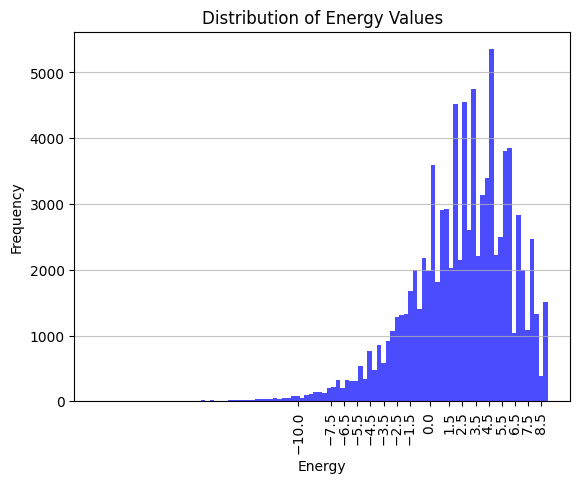

In [16]:
import matplotlib.pyplot as plt
import numpy as np
import os
dataset = os.listdir('../../RFAM')
#dataset.remove('sequence_multi.fasta.out')
plot = []
for file in dataset:
    if file.endswith('.out'):
        ##print("File name: ", os.path.join('../Dataset/hairpins', file))
        (seq_names, refined_data_multi) = get_data(os.path.join('../../RFAM', file), 100.0)
        scores = extract_first_elements(refined_data_multi)
        plot.extend(i for i in scores)
plt.hist(plot, bins=100, color='blue', alpha=0.7)
plt.xlabel('Energy')
plt.ylabel('Frequency')
plt.title('Distribution of Energy Values')
plt.grid(axis='y', alpha=0.75)
plt.xticks([-10.0, -7.5, -6.5, -5.5, -4.5, -3.5, -2.5, -1.5, 0, 1.5, 2.5, 3.5, 4.5, 5.5, 6.5, 7.5, 8.5])
plt.xticks(rotation=90)
# plt.show()
        # pals = palindromes(refined_data_multi)
        # for seqname in pals:
        #     graph = pgraph(pals[seqname])
        #     G = build_directed_graph_from_dict(graph)
        #     # Print some information about the graph
        #     print("Nodes of the graph:", G.nodes())
        #     print("Edges of the graph:", G.edges())
        #     fp = fingerprint(G, pals[seqname], 5) #max_path_length=5
        #     print("Fingerprint for sequence ", seqname, " :", fp)
        #     bin_fp = string_fingerprint_with_positions(fp)
        #     #print("Binary fingerprint for sequence ", seqname, " :", bin_fp)
        #     print("Non-zero indices for bin_fp:", [i for i, b in enumerate(bin_fp) if b == 1])

In [17]:
# extracting length of each hairpin
def extract_length(list_of_lists):
    """Extracts the length of each hairpin from a list of lists."""
    lengths = []
    for sublist in list_of_lists:
        #score = list_of_lists[sublist]
        for i in list_of_lists[sublist]:
            #print("i=", i)
            length = int(i[3])-int(i[1])
            lengths.append(length)
    return lengths

In [18]:
hairpin_lengths = []
for file in dataset:
    if file.endswith('.out'):
        ##print("File name: ", os.path.join('../Dataset/hairpins', file))
        (seq_names, refined_data_multi) = get_data(os.path.join('../../RFAM', file), 100.0)
        lengths = extract_length(refined_data_multi)
        hairpin_lengths.extend(i for i in lengths)
hairpin_lengths

[10,
 10,
 12,
 11,
 13,
 15,
 11,
 15,
 10,
 12,
 14,
 16,
 10,
 12,
 14,
 16,
 18,
 20,
 12,
 10,
 11,
 10,
 10,
 12,
 14,
 10,
 10,
 12,
 10,
 10,
 16,
 10,
 12,
 14,
 16,
 18,
 20,
 11,
 11,
 10,
 10,
 13,
 10,
 11,
 11,
 10,
 12,
 14,
 10,
 12,
 11,
 13,
 15,
 17,
 19,
 21,
 23,
 17,
 12,
 11,
 13,
 16,
 18,
 17,
 19,
 10,
 12,
 10,
 27,
 29,
 31,
 10,
 11,
 13,
 10,
 11,
 10,
 10,
 11,
 12,
 10,
 11,
 10,
 12,
 10,
 10,
 10,
 10,
 12,
 14,
 14,
 10,
 10,
 12,
 11,
 13,
 15,
 10,
 10,
 11,
 10,
 12,
 12,
 10,
 12,
 13,
 10,
 11,
 11,
 14,
 10,
 12,
 10,
 12,
 14,
 16,
 18,
 10,
 10,
 11,
 10,
 12,
 10,
 16,
 10,
 12,
 14,
 10,
 10,
 12,
 12,
 11,
 10,
 12,
 14,
 10,
 10,
 12,
 14,
 13,
 10,
 11,
 14,
 11,
 11,
 13,
 10,
 10,
 10,
 10,
 12,
 14,
 10,
 11,
 10,
 12,
 14,
 10,
 11,
 13,
 10,
 10,
 12,
 11,
 10,
 12,
 12,
 10,
 12,
 11,
 12,
 13,
 10,
 11,
 10,
 11,
 10,
 12,
 14,
 16,
 12,
 14,
 12,
 10,
 10,
 11,
 14,
 10,
 12,
 10,
 11,
 14,
 10,
 14,
 10,
 10,
 11,
 12,
 14,
 12,


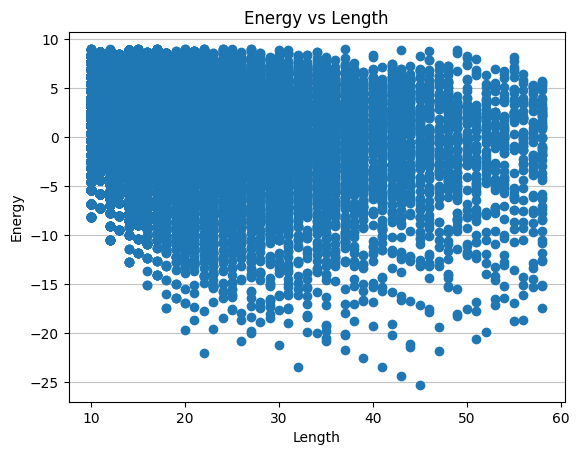

In [25]:
plt.plot(hairpin_lengths, plot, 'o')
plt.xlabel('Length')
plt.ylabel('Energy')
plt.title('Energy vs Length')
plt.grid(axis='y', alpha=0.75)

In [20]:
# building tanimoto function and testing
# Fix this function
def tanimoto_bitvector(fp1, fp2):
    # pair both fingerprints index-wise and find common 1's,
    # then sum calculates how many 1's are in common
    intersection = sum(a & b for a, b in zip(fp1, fp2))
    # pair both fingerprints index-wise and sum all positions that
    # are 1 on either fingerprint
    union = sum(a | b for a, b in zip(fp1, fp2))
    # return sum of common 1's divided by all 1's -> Tanimoto
    return intersection / union if union != 0 else 0.0

#testing
(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/glutII_2.fasta.out', 9.0)
(seq_names2, refined_data_multi2) = get_data('../Dataset/hairpins/sequence_1.fasta.out', 9.0)
pals = palindromes(refined_data_multi)
pals2 = palindromes(refined_data_multi2)
for seqname in pals:
    graph = pgraph(pals[seqname])
    G = build_directed_graph_from_dict(graph)
    # Print some information about the graph
    print("Nodes of the graph:", G.nodes())
    print("Edges of the graph:", G.edges())
    fp = fingerprint(G, pals[seqname], 5) #max_path_length=5
    #print("Fingerprint for sequence ", seqname, " :", fp)
    bin_fp = string_fingerprint_with_positions(fp)
    print("Binary fingerprint for sequence ", seqname, " :", bin_fp)
    #print("Non-zero indices for bin_fp:", [i for i, b in enumerate(bin_fp) if b == 1])
    
for seqname in pals2:
    graph2 = pgraph(pals2[seqname])
    G2 = build_directed_graph_from_dict(graph2)
    # Print some information about the graph
    print("Nodes of the graph:", G2.nodes())
    print("Edges of the graph:", G2.edges())
    fp2 = fingerprint(G2, pals2[seqname], 5) #max_path_length=5
    bin_fp2 = string_fingerprint_with_positions(fp2)
    print("Binary fingerprint for sequence ", seqname, " :", bin_fp2)
    #print("Non-zero indices for bin_fp2:", [i for i, b in enumerate(bin_fp2) if b == 1])
print("Length of bin_fp:", len(bin_fp))    
print("Length of bin_fp2:", len(bin_fp2))
print("Tanimoto score between sequence 1 and sequence 2: ", tanimoto_bitvector(bin_fp, bin_fp2))
#print("Tanimoto score between non-zero indices of sequence 1 and sequence 2: ", tanimoto_bitvector([i for i, b in enumerate(bin_fp) if b == 1], [i for i, b in enumerate(bin_fp2) if b == 1]))

Nodes of the graph: [0, 6, 7, 8, 9, 10, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 1, 2, 3, 4, 5, 11, 12, 13, 14, 15]
Edges of the graph: [(0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (6, 10), (6, 19), (6, 20), (6, 21), (6, 22), (6, 23), (6, 24), (6, 25), (6, 26), (6, 27), (6, 28), (6, 29), (6, 30), (6, 31), (6, 32), (6, 33), (6, 34), (6, 35), (6, 36), (6, 37), (6, 38), (6, 39), (6, 40), (6, 41), (6, 42), (6, 43), (6, 44), (6, 45), (6, 46), (6, 47), (6, 48), (7, 10), (7, 18), (7, 19), (7, 20), (7, 21), (7, 22), (7, 23), (7, 24), (7, 25), (7, 26), (7, 27), (7, 28), (7, 29), (7, 30), (7, 31), (7, 32), (7, 33), (7

In [21]:
# Real tanimoto
#0010
#0110
# positions where they agree and have 1 / positions either have 1
tan1 = [1, 0, 0, 0]
tan2 = [0, 1, 1, 1]
print("Tanimoto score between sequence 1 and sequence 2: ", tanimoto_bitvector(tan1, tan2))

Tanimoto score between sequence 1 and sequence 2:  0.0


In [22]:
zeros = []
for i in range(1, 1000000):
    if i % 1024 == 0:
        zeros.append(i)
print(len(zeros)/1000000*100)

0.09759999999999999


In [23]:
# def path(graph,start,p=[]):
#     '''This function give complete paths from each pallindrome'''
#     p = p + [start]
#     if graph[start] == []:
#         return [p]
#     paths = []
#     for node in graph[start]:
#         if node not in p:
#             new_paths = path(graph,node,p)
#             for new_path in new_paths:
#                 paths.append(new_path)
#     return paths


(seq_names, refined_data_multi) = get_data('../Dataset/hairpins/sequence_multi.fasta.out', 2.0)
pals = palindromes(refined_data_multi)
for seqname in pals:
    graph = pgraph(pals[seqname])
    print("graph is now=", graph)
    paths = path(graph,0)
    print("Sequence=", seqname, "\n", "Paths=", paths)
    paths = path(graph,1)
    print("Sequence=", seqname, "\n", "Paths=", paths)
    

graph is now= {0: [2, 3], 1: [], 2: [], 3: []}


TypeError: 'list' object is not callable